In [6]:
library(fpp3)
library(stringr)
library(plotly)
library(mclust)
library(factoextra)
library(clValid)
library(cluster)
library(NbClust)
library(dbscan)
library(dendextend)
library(ggfortify)
library(GGally)
options(repr.plot.width=20, repr.plot.height=10)

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



## Prepare Data

In [7]:
df_sales_ori <- read.csv("sales_train_validation_afcs2022.csv")
df_sales_ori = df_sales_ori %>%
    pivot_longer(!id, names_to = "day", values_to = "sales")
df_sales = df_sales_ori %>%
    # extract day number d_1 -> 1
    mutate(day = str_split(day, "_", simplify = TRUE)[ , 2]) %>%
    # transform day number to date
    mutate(date = as_date("2011-01-29") + strtoi(day)-1) %>%
    select(-day)
df_sales = df_sales %>% 
    mutate(year = year(date)) %>% 
    mutate(month = yearmonth(date)) %>% 
    mutate(week = yearweek(date)) %>% 
    mutate(quarter = yearquarter(date)) %>% 
    mutate(weekdays = weekdays(date))
head(df_sales)

ERROR: [1m[33mError[39m in `pivot_longer_spec()`:[22m
[33m![39m Can't combine `wm_yr_wk` <integer> and `date` <character>.


In [8]:
df_calendar <- read.csv("calendar_afcs2022.csv") %>%
                mutate(date = as_date(date, format= "%m/%d/%Y"))
df_sales_ori <- read.csv("sales_train_validation_afcs2022.csv")
df_sales_ori = df_sales_ori %>%
    pivot_longer(!id, names_to = "day", values_to = "sales")
df_sales_temp = df_sales_ori %>%
    # extract day number d_1 -> 1
    mutate(day = str_split(day, "_", simplify = TRUE)[ , 2]) %>%
    # transform day number to date
    mutate(date = as_date("2011-01-29") + strtoi(day)-1) %>%
    select(-day)
df_price <- read.csv("sell_prices_afcs2022.csv") %>%
            mutate(item_validation_id = paste(item_id,"_",store_id, "_validation",sep = ""))
df_sales_cal = merge(df_sales_temp, df_calendar, by=c("date")) %>%
                mutate(item_validation_id = id)
df_sales_cal_price = df_sales_cal  %>% 
    left_join(df_price, by=c("item_validation_id","wm_yr_wk")) %>%
    group_by(id)   %>%
    fill(everything()) %>%
    fill(everything(), .direction = 'up') %>%
    ungroup() %>%
    mutate(day_of_month = as.numeric(format(date,'%d')))
head(df_sales_cal_price)
nrow(df_sales_cal_price)

date,id,sales,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_TX,item_validation_id,store_id,item_id,sell_price,day_of_month
<date>,<chr>,<int>,<int>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>
2011-01-29,FOODS_3_001_TX_3_validation,0,11101,Saturday,1,1,2011,SuperBowl,Sporting,Easter,Cultural,0,FOODS_3_001_TX_3_validation,TX_3,FOODS_3_001,2.28,29
2011-01-29,FOODS_3_296_TX_3_validation,0,11101,Saturday,1,1,2011,SuperBowl,Sporting,Easter,Cultural,0,FOODS_3_296_TX_3_validation,TX_3,FOODS_3_296,2.00,29
2011-01-29,FOODS_3_441_TX_3_validation,0,11101,Saturday,1,1,2011,SuperBowl,Sporting,Easter,Cultural,0,FOODS_3_441_TX_3_validation,TX_3,FOODS_3_441,6.48,29
2011-01-29,FOODS_3_737_TX_3_validation,0,11101,Saturday,1,1,2011,SuperBowl,Sporting,Easter,Cultural,0,FOODS_3_737_TX_3_validation,TX_3,FOODS_3_737,3.48,29
2011-01-29,FOODS_3_292_TX_3_validation,0,11101,Saturday,1,1,2011,SuperBowl,Sporting,Easter,Cultural,0,FOODS_3_292_TX_3_validation,TX_3,FOODS_3_292,3.50,29
2011-01-29,FOODS_3_437_TX_3_validation,0,11101,Saturday,1,1,2011,SuperBowl,Sporting,Easter,Cultural,0,FOODS_3_437_TX_3_validation,TX_3,FOODS_3_437,1.00,29


[1] 1574399

## Products Feature Engineering

In [9]:
# Common Functions
scale_numeric <- function(x){
    x %>% mutate_if(is.numeric, function(y){as.vector(scale(y, center = TRUE, scale = TRUE))} )
}

In [14]:
product_yearly_features = df_sales_cal_price %>%
    select(id, year, sales, sell_price)  %>%
    group_by(id) %>%
    summarise(total_sales = sum(sales), 
              sd_sales = sd(sales),
              mean_price = mean(sell_price), 
              sd_price = sd(sell_price), .groups="drop")  %>%
    select(id, total_sales, sd_sales, mean_price, sd_price)
head(product_yearly_features)

id,total_sales,sd_sales,mean_price,sd_price
<chr>,<int>,<dbl>,<dbl>,<dbl>
FOODS_3_001_TX_3_validation,627,0.7266217,2.467214,0.182534816
FOODS_3_002_TX_3_validation,1396,1.3593927,2.501600,0.009667735
FOODS_3_003_TX_3_validation,226,0.4682942,3.963617,0.132133617
FOODS_3_004_TX_3_validation,162,0.3485484,4.675321,0.716585358
FOODS_3_005_TX_3_validation,1459,1.0420688,2.072525,0.143264219
FOODS_3_006_TX_3_validation,697,0.8178988,7.880000,0.000000000


In [10]:
# Sales for each quarter could be useful to distinguish seasonal food

In [15]:
product_quarterly_features = df_sales_cal_price %>%
    select(id, date, sales)  %>%
    mutate(quarter = quarters(date)) %>%
    group_by(id, quarter) %>% 
    summarise(total_sales = sum(sales), .groups="drop") %>% 
    pivot_wider(names_from = quarter, 
                values_from = c(total_sales))
head(product_quarterly_features)

id,Q1,Q2,Q3,Q4
<chr>,<int>,<int>,<int>,<int>
FOODS_3_001_TX_3_validation,209,122,132,164
FOODS_3_002_TX_3_validation,394,384,289,329
FOODS_3_003_TX_3_validation,83,85,58,0
FOODS_3_004_TX_3_validation,52,33,43,34
FOODS_3_005_TX_3_validation,379,345,414,321
FOODS_3_006_TX_3_validation,247,168,94,188


,id,sales_percent_Q1,sales_percent_Q2,sales_percent_Q3,sales_percent_Q4,mean_price,total_sales
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,FOODS_3_001_TX_3_validation,0.3333333,0.1945774,0.2105263,0.2615630,2.467214,627
2,FOODS_3_002_TX_3_validation,0.2822350,0.2750716,0.2070201,0.2356734,2.501600,1396
3,FOODS_3_003_TX_3_validation,0.3672566,0.3761062,0.2566372,0.0000000,3.963617,226
4,FOODS_3_004_TX_3_validation,0.3209877,0.2037037,0.2654321,0.2098765,4.675321,162
5,FOODS_3_005_TX_3_validation,0.2597670,0.2364633,0.2837560,0.2200137,2.072525,1459
6,FOODS_3_006_TX_3_validation,0.3543759,0.2410330,0.1348637,0.2697274,7.880000,697


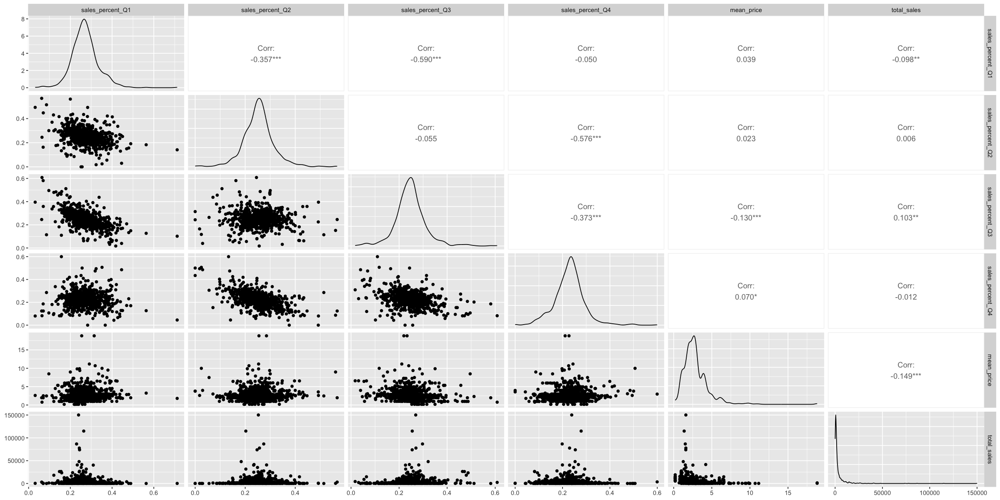

In [ ]:
# merge seasonal sales with yearly features (before)

df_product_features = merge(product_yearly_features, product_quarterly_features, by = "id") %>%
    mutate(sales_percent_Q1 = Q1/total_sales) %>%
    mutate(sales_percent_Q2 = Q2/total_sales) %>%
    mutate(sales_percent_Q3 = Q3/total_sales) %>%
    mutate(sales_percent_Q4 = Q4/total_sales) %>%
    select(id, sales_percent_Q1, sales_percent_Q2, sales_percent_Q3, sales_percent_Q4, mean_price, total_sales)
head(df_product_features)
ggpairs(df_product_features[, -1])

In [ ]:
# merge seasonal sales with yearly features

df_product_features = merge(product_yearly_features, product_quarterly_features, by = "id") %>%
    mutate(sales_percent_Q1 = Q1/total_sales) %>%
    mutate(sales_percent_Q2 = Q2/total_sales) %>%
    mutate(sales_percent_Q3 = Q3/total_sales) %>%
    mutate(sales_percent_Q4 = Q4/total_sales) %>%
    select(id, sales_percent_Q1, sales_percent_Q4, mean_price)
head(df_product_features)

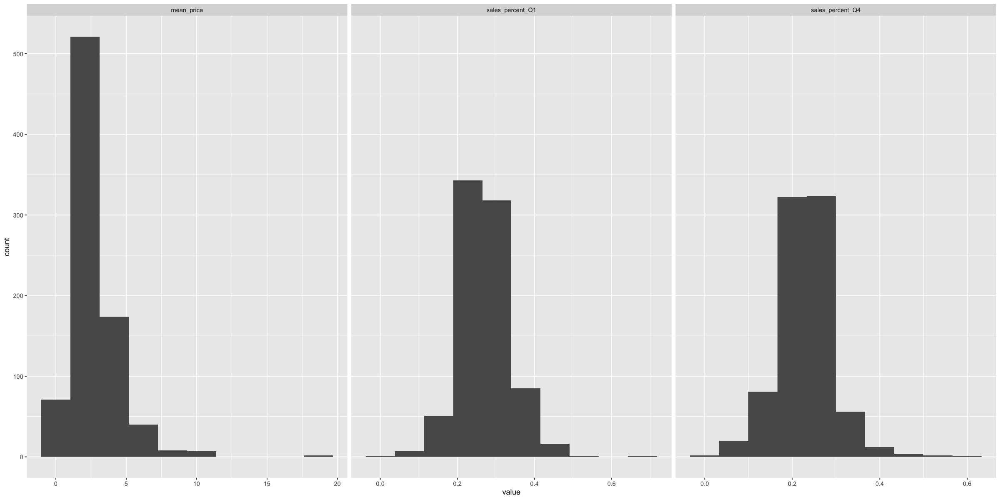

In [10]:
# normalization
ggplot(gather(df_product_features[, -1]), aes(value)) + 
    geom_histogram(bins = 10) + 
    facet_wrap(~key, scales = 'free_x')

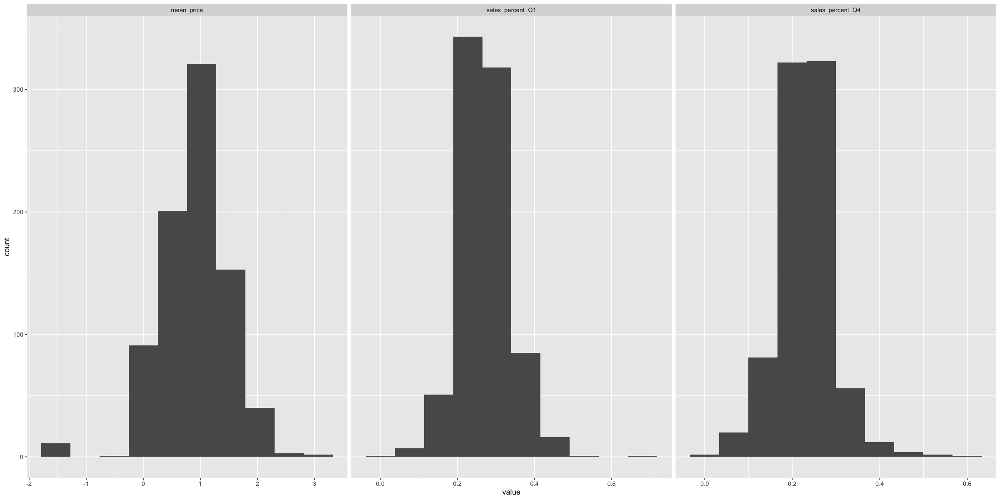

In [11]:
df_product_features_norm = df_product_features%>%
                            mutate(mean_price = log(mean_price))

ggplot(gather(df_product_features_norm[, -1]), aes(value)) + 
    geom_histogram(bins = 10) + 
    facet_wrap(~key, scales = 'free_x')

,id,sales_percent_Q1,sales_percent_Q4,mean_price
,<chr>,<dbl>,<dbl>,<dbl>
1,FOODS_3_001_TX_3_validation,0.9795337,0.5206735,0.01270673
2,FOODS_3_002_TX_3_validation,0.1772892,0.1124147,0.03645374
3,FOODS_3_003_TX_3_validation,1.5121296,-3.6039643,0.82607309
4,FOODS_3_004_TX_3_validation,0.7857065,-0.2943802,1.10940823
5,FOODS_3_005_TX_3_validation,-0.1754583,-0.1345253,-0.28638054
6,FOODS_3_006_TX_3_validation,1.3099019,0.6494196,2.00506454


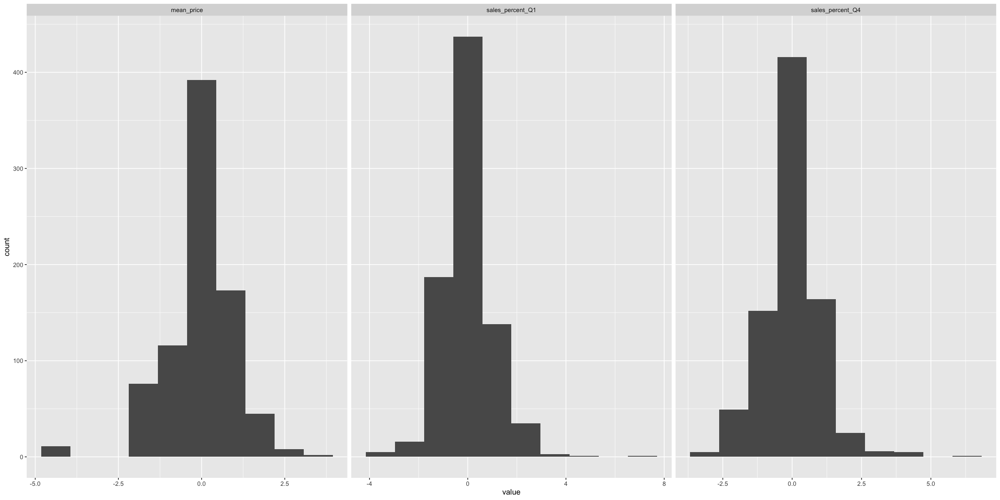

In [12]:
df_product_features_scaled = scale_numeric(df_product_features_norm)
head(df_product_features_scaled)
ggplot(gather(df_product_features_scaled[, -1]), aes(value)) + 
    geom_histogram(bins = 10) + 
    facet_wrap(~key, scales = 'free_x')

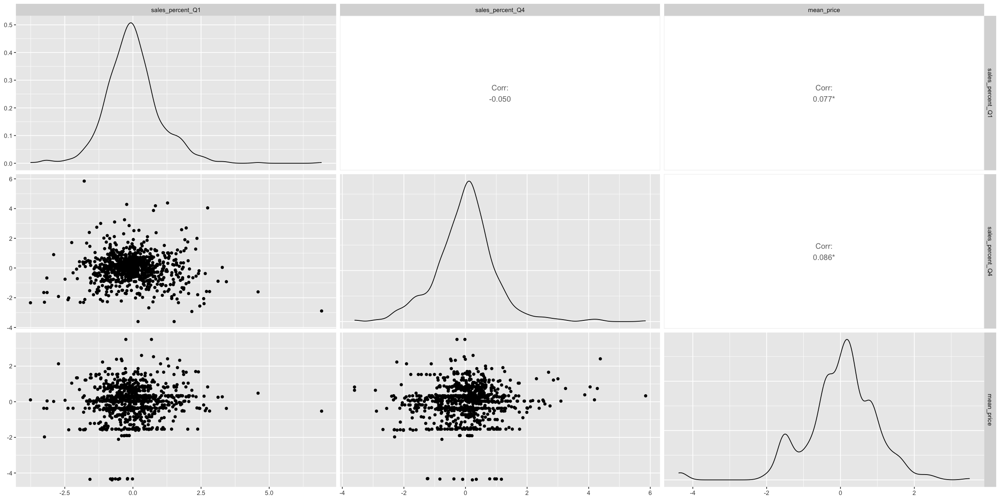

In [13]:
ggpairs(df_product_features_scaled[, -1]) 

## Clustering Experiments

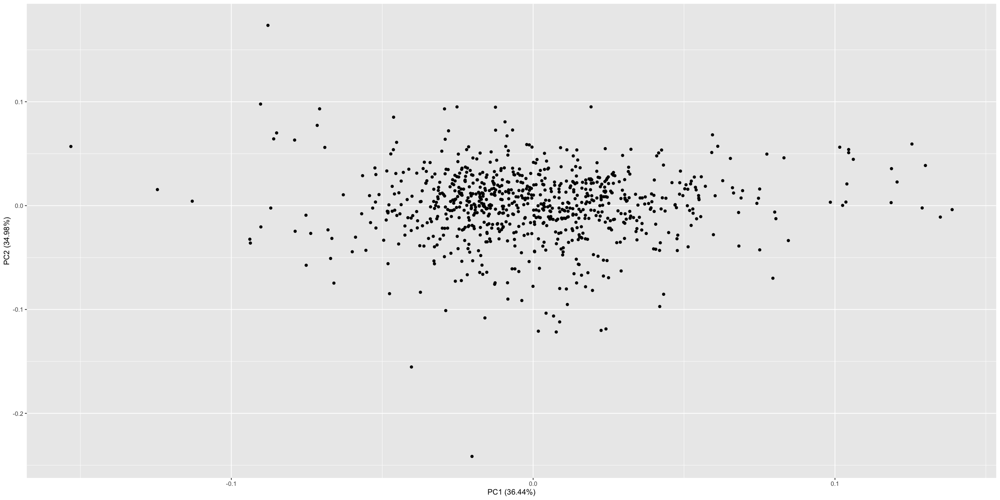

In [14]:
# PCA
draw_pca = function(data2reduce, ori_data, color_col){
    pca_res <- prcomp(data2reduce, scale. = TRUE)
    # fviz_pca_ind(pca_res)
    if(missing(color_col)) {
       autoplot(pca_res, data=ori_data, label = FALSE, label.size = 3)
    } else {
           autoplot(pca_res, data=ori_data, colour = color_col, label = FALSE, label.size = 3)
    }
}
draw_pca(df_product_features_scaled[, -1], df_product_features_scaled)

It is difficult to say which clustering method is the "best" for supermarket products clustering, as the appropriate method will depend on the specific goals and characteristics of the data. Here is a brief overview of some common clustering methods and their potential strengths and weaknesses:

- K-means: K-means is a popular clustering method that involves dividing the data into a predetermined number of clusters (specified by the user). It is simple to implement and can be very fast, but it is sensitive to the initial starting points and may not work well with non-linearly distributed data.

- Hierarchical: Hierarchical clustering involves creating a hierarchy of clusters, where each cluster is formed by merging two smaller clusters. It is relatively easy to implement and can handle large datasets, but it can be slower than other methods and may not be well-suited to data with many noise points. Hierarchical clustering does not require normal (i.e., Gaussian) distributed data. It is a method of clustering that involves creating a hierarchy of clusters, where each cluster is formed by merging two smaller clusters. Hierarchical clustering can be used with any type of data, regardless of its distribution. That being said, some clustering methods are more sensitive to the distribution of the data than others. For example, k-means clustering, which is a centroid-based method, assumes that the data is roughly spherical and equally distributed around the centroids. This means that k-means may not perform as well with data that is heavily skewed or has a more complex distribution. Hierarchical clustering, on the other hand, does not make any assumptions about the distribution of the data and can handle a wide range of data types. It is always a good idea to explore the distribution of the data and consider whether it is appropriate for the chosen clustering method. However, in general, hierarchical clustering is a robust method that can be used with a wide variety of data types.

- GMM (Gaussian Mixture Model): GMM is a probabilistic model that assumes that the data is generated from a mixture of multiple Gaussian distributions. It is more flexible than k-means and can handle non-linearly distributed data, but it can be slower and may be sensitive to initialization. GMM (Gaussian Mixture Model) is a probabilistic model that assumes that the data is generated from a mixture of multiple Gaussian distributions. This means that GMM does require that the data be normally distributed in order to be used effectively. However, it is worth noting that GMM is a flexible model that can handle a wide range of data types, even if they are not perfectly normally distributed. In practice, GMM can often be used to model data that is not perfectly normally distributed, as long as the deviations from normality are not too severe. It is always a good idea to explore the distribution of the data and consider whether it is appropriate for the chosen clustering method. If the data is heavily skewed or has a more complex distribution, other clustering methods may be more suitable. However, if the data is roughly normally distributed, GMM can be a powerful tool for clustering and data analysis.

- PAM (Partitioning Around Medoids): PAM is a variant of k-means that uses medoids (points that are representative of a cluster) instead of means. It can be more robust to noise and outliers than k-means, but it can be slower and may not perform as well with very large datasets. PAM (Partitioning Around Medoids) is a variant of k-means clustering that uses medoids (points that are representative of a cluster) instead of means to define the clusters. Like k-means, PAM is a centroid-based method that assumes that the data is roughly spherical and equally distributed around the centroids. This means that PAM may be sensitive to the distribution of the data and may not perform as well with data that is heavily skewed or has a more complex distribution. However, it is worth noting that PAM is generally more robust to noise and outliers than k-means, so it may be a better choice for data that has a high level of noise or has a few extreme values. PAM can also handle categorical data, which k-means cannot, making it a more flexible method for some types of datasets. It is always a good idea to explore the distribution of the data and consider whether it is appropriate for the chosen clustering method. If the data is heavily skewed or has a more complex distribution, other clustering methods may be more suitable. However, if the data is roughly normally distributed, PAM can be a useful tool for clustering and data analysis.

- DBSCAN (Density-Based Spatial Clustering of Applications with Noise): DBSCAN is a density-based clustering method that does not require the user to specify the number of clusters in advance. It is robust to noise and can handle data with arbitrary shapes, but it can be sensitive to the choice of parameters and may not work well with data that is not well-separated. DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is a density-based clustering method that does not require the user to specify the number of clusters in advance. It works by identifying regions of high density and using them to define clusters, with points that are not part of a dense region being marked as noise. DBSCAN does not make any assumptions about the distribution of the data and can handle a wide range of data types, including data with arbitrary shapes and complex distributions. This means that DBSCAN does not require normal (i.e., Gaussian) distributed data in order to be used effectively. In fact, DBSCAN is particularly well-suited to data that is not normally distributed and has a more complex or irregular shape. It is robust to noise and can handle data with arbitrary shapes, making it a good choice for data that is difficult to cluster using other methods. It is always a good idea to explore the distribution of the data and consider whether it is appropriate for the chosen clustering method. However, in general, DBSCAN is a flexible and robust method that can be used with a wide variety of data types, including data that is not normally distributed.

In [15]:
# choose a clustering method
clmethods = c("hierarchical","kmeans", "pam")
max_items = nrow(df_product_features_scaled)
internal = clValid(df_product_features_scaled[, -1], nClust = 2:8,
                       clMethods = clmethods, validation = "internal", maxitems=max_items)
summary(internal)

Warning message in clValid(df_product_features_scaled[, -1], nClust = 2:8, clMethods = clmethods, :
“rownames for data not specified, using 1:nrow(data)”



Clustering Methods:
 hierarchical kmeans pam 

Cluster sizes:
 2 3 4 5 6 7 8 

Validation Measures:
                                  2        3        4        5        6        7        8
                                                                                         
hierarchical Connectivity    2.9290   3.1512  16.3929  30.6925  33.2437  39.0476  48.2603
             Dunn            0.2840   0.2248   0.0943   0.1048   0.1048   0.1048   0.0953
             Silhouette      0.7130   0.5494   0.4771   0.4108   0.3988   0.3029   0.2443
kmeans       Connectivity  137.4107 136.8687 215.9929 272.1417 226.1353 247.1337 291.4171
             Dunn            0.0098   0.0119   0.0099   0.0063   0.0117   0.0152   0.0084
             Silhouette      0.2175   0.2438   0.2294   0.2194   0.2246   0.2422   0.2297
pam          Connectivity  160.1266 161.5778 254.8960 267.2619 259.3929 316.2655 331.6587
             Dunn            0.0126   0.0163   0.0138   0.0077   0.0143   0.0084   0.0041

In [16]:
stab = clValid(df_product_features_scaled[, -1], nClust = 2:8,
                       clMethods = clmethods, validation = "stability", maxitems=max_items)
summary(stab)

Warning message in clValid(df_product_features_scaled[, -1], nClust = 2:8, clMethods = clmethods, :
“rownames for data not specified, using 1:nrow(data)”



Clustering Methods:
 hierarchical kmeans pam 

Cluster sizes:
 2 3 4 5 6 7 8 

Validation Measures:
                       2      3      4      5      6      7      8
                                                                  
hierarchical APN  0.0096 0.0160 0.0156 0.0364 0.0366 0.1164 0.1460
             AD   2.1432 2.0878 2.0554 2.0363 2.0312 2.0217 2.0063
             ADM  0.0476 0.1020 0.1260 0.1977 0.1988 0.3229 0.3596
             FOM  0.9976 0.9970 0.9942 0.9945 0.9938 0.9926 0.9871
kmeans       APN  0.1831 0.2855 0.4367 0.4620 0.5085 0.5634 0.5766
             AD   2.0621 1.9467 1.8902 1.8173 1.7604 1.7196 1.6927
             ADM  0.6443 0.8527 0.9646 0.9664 0.9526 0.9970 1.0121
             FOM  0.9984 0.9971 0.9962 0.9948 0.9926 0.9909 0.9928
pam          APN  0.3189 0.4066 0.4719 0.5003 0.5285 0.5679 0.6104
             AD   2.0455 1.9144 1.8417 1.7702 1.7318 1.6914 1.6719
             ADM  0.6657 0.8187 0.8784 0.8645 0.9121 0.9235 0.9709
             FOM  1.0001 0.9

according to the above results, clustering method would be prefered comparing to k-means and PAM 

## Hierarchical clustering

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 


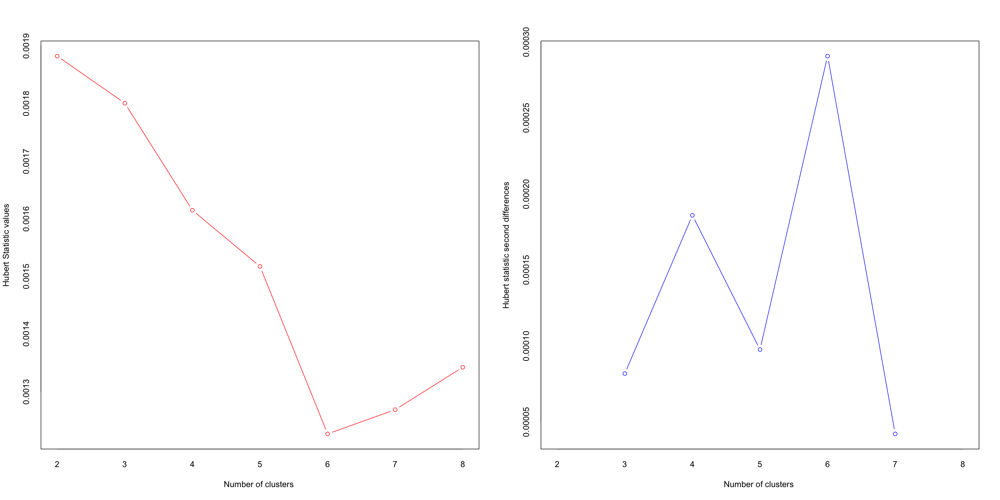

*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 10 proposed 2 as the best number of clusters 
* 2 proposed 3 as the best number of clusters 
* 2 proposed 5 as the best number of clusters 
* 7 proposed 6 as the best number of clusters 
* 3 proposed 8 as the best number of clusters 

                   ***** Conclusion *****                            
 
* According to the majority rule, the best number of clusters is  2 
 
 
******************************************************************* 


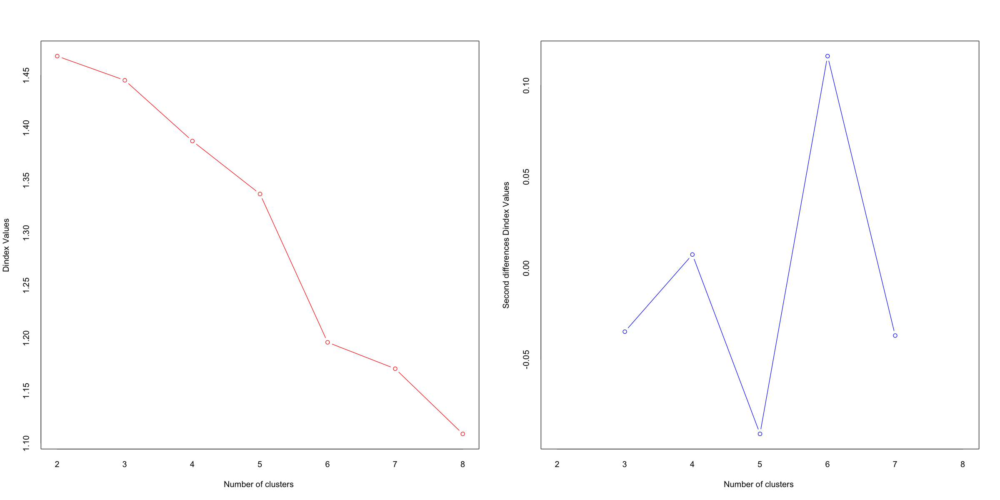

In [17]:
# choose number of clusters
nb.fit = NbClust(df_product_features_scaled[,-1], distance= "euclidean", min.nc=2, max.nc=8, method="complete", index="all")

In [18]:
num_cluster = 6

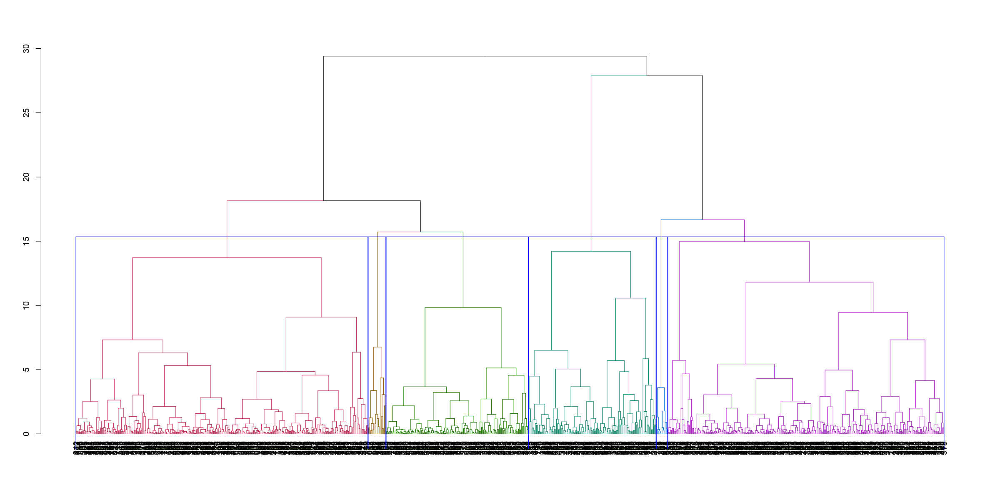

In [19]:
dd = dist(df_product_features_scaled[,-1])
hc = hclust(dd,method="ward.D2")
hc.col =color_branches(as.dendrogram(hc),k=num_cluster)
plot(hc.col)
rect.hclust(hc,k=num_cluster,border="blue")

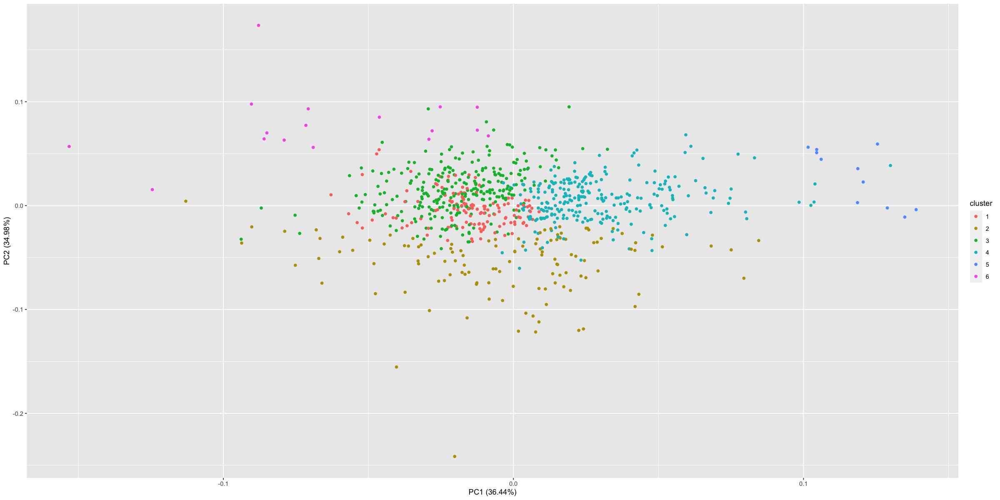

In [20]:
cluster = cutree(hc, k=num_cluster)
df_product_features_scaled_cluster = df_product_features_scaled
df_product_features_scaled_cluster$cluster = as.factor(cluster)
draw_pca(df_product_features_scaled[, -1], df_product_features_scaled_cluster, "cluster")

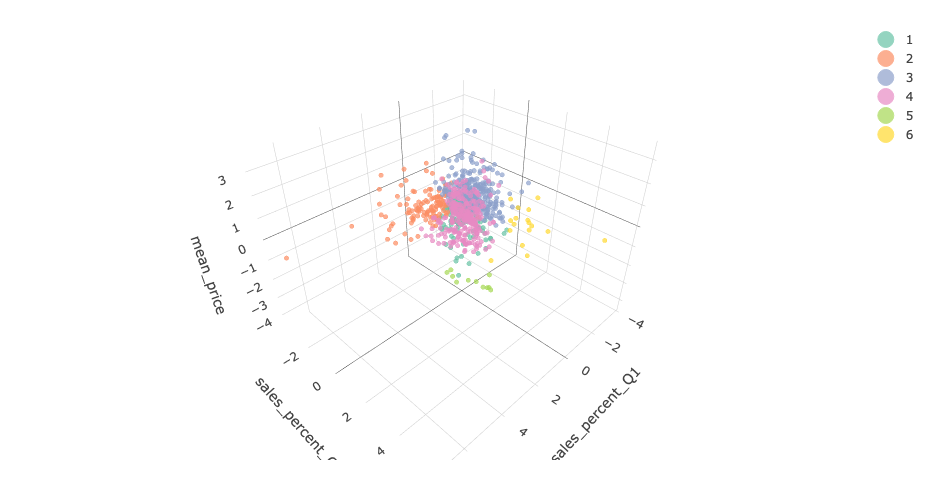

In [21]:
plot_ly(df_product_features_scaled_cluster, 
        x=~sales_percent_Q1, y=~sales_percent_Q4, z=~mean_price, color=~cluster, 
        width = 500, height = 500) %>%
        add_markers(size=1)


In [22]:
table(cluster)
head(df_product_features_scaled_cluster)

cluster
  1   2   3   4   5   6 
135 121 277 262  11  17 

,id,sales_percent_Q1,sales_percent_Q4,mean_price,cluster
,<chr>,<dbl>,<dbl>,<dbl>,<fct>
1,FOODS_3_001_TX_3_validation,0.9795337,0.5206735,0.01270673,1
2,FOODS_3_002_TX_3_validation,0.1772892,0.1124147,0.03645374,1
3,FOODS_3_003_TX_3_validation,1.5121296,-3.6039643,0.82607309,2
4,FOODS_3_004_TX_3_validation,0.7857065,-0.2943802,1.10940823,3
5,FOODS_3_005_TX_3_validation,-0.1754583,-0.1345253,-0.28638054,4
6,FOODS_3_006_TX_3_validation,1.3099019,0.6494196,2.00506454,2


  cluster size ave.sil.width
1       1  135          0.29
2       2  121          0.07
3       3  277          0.18
4       4  262          0.13
5       5   11          0.69
6       6   17          0.29


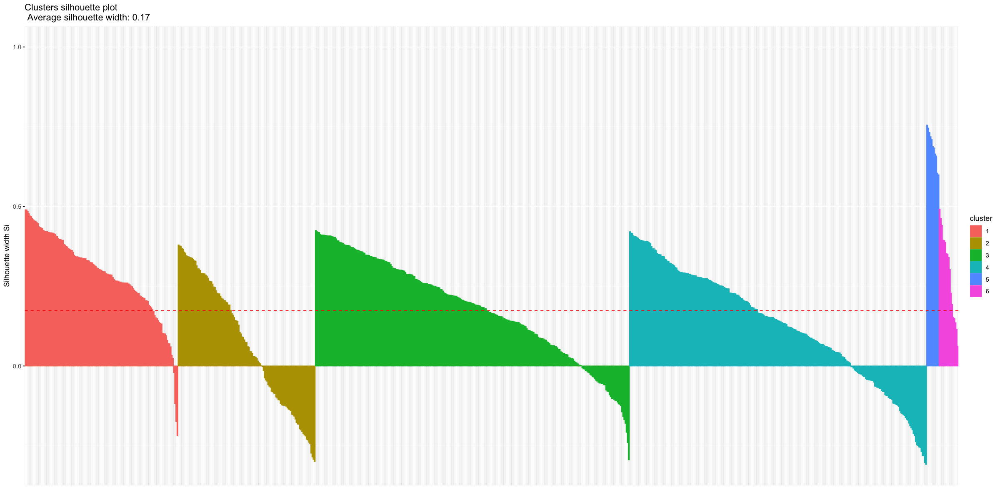

In [23]:
# post-hoc verify number of cluster
sil = silhouette(cluster,dd)
fviz_silhouette(sil)

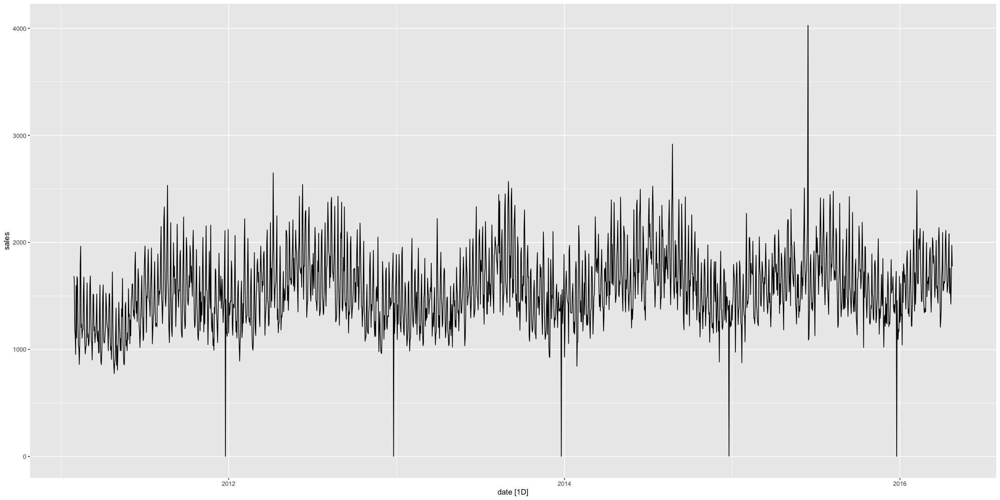

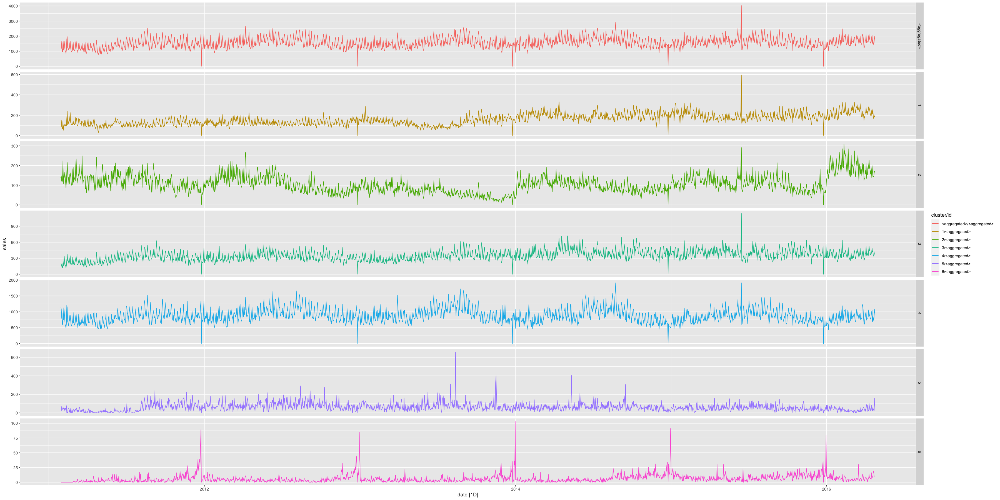

In [24]:
df_product_cluster = df_product_features_scaled_cluster %>% 
    select(id, cluster)
df_sales_cal_price_cluster = merge(df_product_cluster, df_sales_cal_price, by=c("id"))
tsibble_aggregated_sales = df_sales_cal_price_cluster %>%
    group_by(date)  %>%
    summarise(sales = sum(sales), .groups="drop")  %>%
    as_tsibble(index=date)
tsibble_aggregated_sales %>%
    autoplot(sales)

draw_hts_sales = function(df_sales_cal_price_cluster){
    df_sales_cal_price_cluster = df_sales_cal_price_cluster %>%
    mutate(cluster = as.factor(cluster))
    tsibble_sales_cluster <- df_sales_cal_price_cluster %>%
      as_tsibble(key = c(cluster, id), index = date) 
    hts_sales = tsibble_sales_cluster %>%
         aggregate_key(cluster/id, sales = sum(sales))
    options(repr.plot.width=30, repr.plot.height=15)
    hts_sales %>%
        filter(is_aggregated(id)) %>%
        autoplot(sales) + 
        facet_grid(vars(cluster), scales = "free_y")
}
draw_hts_sales(df_sales_cal_price_cluster)

In [25]:
df_product_features_hc = df_product_features_scaled_cluster %>%
    select(id, cluster)
head(df_product_features_hc)

,id,cluster
,<chr>,<fct>
1,FOODS_3_001_TX_3_validation,1
2,FOODS_3_002_TX_3_validation,1
3,FOODS_3_003_TX_3_validation,2
4,FOODS_3_004_TX_3_validation,3
5,FOODS_3_005_TX_3_validation,4
6,FOODS_3_006_TX_3_validation,2


## GMM

In [26]:
mc <- Mclust(df_product_features_scaled[,-1], G=2:10)
summary(mc)

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 5
components: 

 log-likelihood   n df       BIC       ICL
      -3162.273 823 49 -6653.482 -7092.004

Clustering table:
  1   2   3   4   5 
510  52 126  87  48 

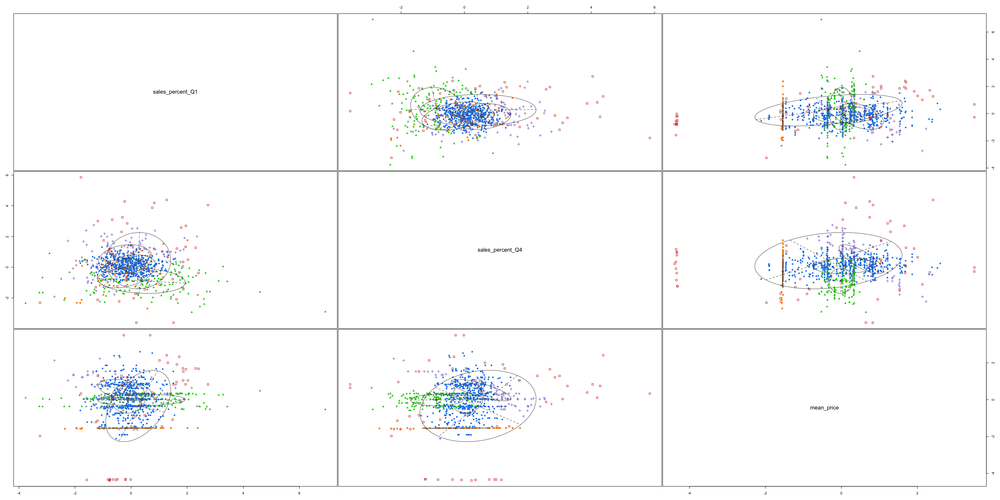

In [27]:
plot(mc, what = "classification")

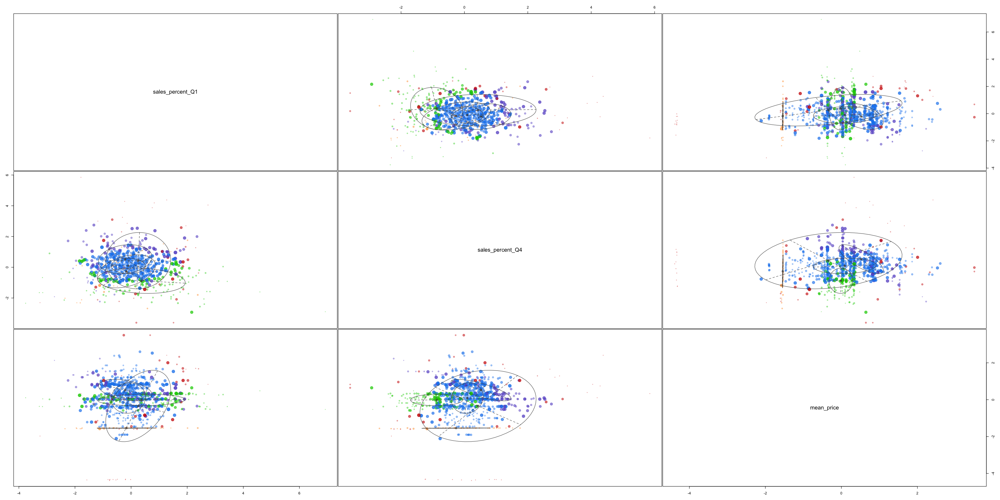

In [28]:
plot(mc, what = "uncertainty")

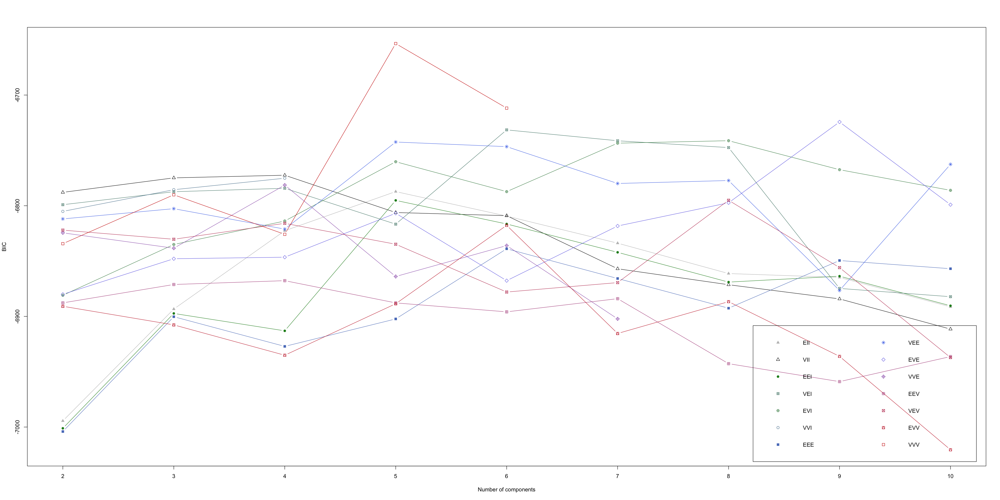

In [29]:
plot(mc, what="BIC")

In [30]:
mc$parameters

sales_percent_Q1,-0.09752534,0.2541106,0.36974302,-0.2093605,-0.1710761
sales_percent_Q4,0.08982001,0.4288500,-0.87579243,0.5235139,-0.2622999
mean_price,0.09059824,-0.3401580,-0.01415292,0.5207610,-1.5419937


In [31]:
df_product_features_scaled_cluster$cluster = mc$classification

In [32]:
head(df_product_features_scaled_cluster)

,id,sales_percent_Q1,sales_percent_Q4,mean_price,cluster
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,FOODS_3_001_TX_3_validation,0.9795337,0.5206735,0.01270673,1
2,FOODS_3_002_TX_3_validation,0.1772892,0.1124147,0.03645374,1
3,FOODS_3_003_TX_3_validation,1.5121296,-3.6039643,0.82607309,2
4,FOODS_3_004_TX_3_validation,0.7857065,-0.2943802,1.10940823,1
5,FOODS_3_005_TX_3_validation,-0.1754583,-0.1345253,-0.28638054,1
6,FOODS_3_006_TX_3_validation,1.3099019,0.6494196,2.00506454,2


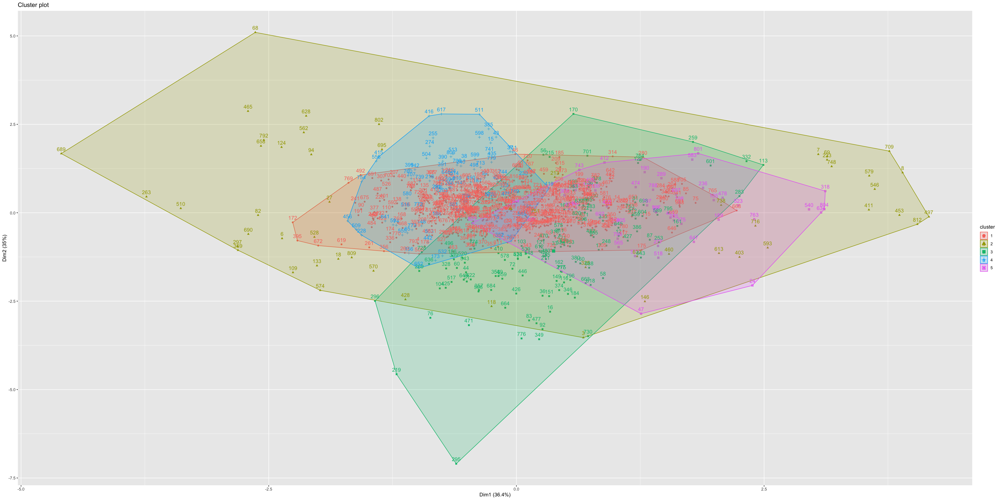

In [33]:
fviz_cluster(mc, df_product_features_scaled[,-1])

Warning message:
“`gather_()` was deprecated in tidyr 1.2.0.
ℹ Please use `gather()` instead.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>.”


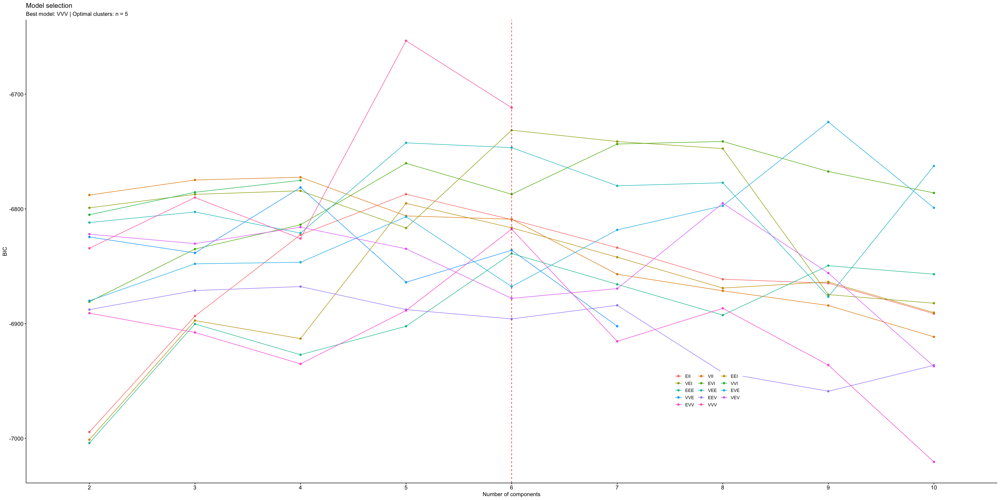

In [34]:
fviz_mclust_bic(mc)

In [35]:
## Whether cluster could help to distingush different seasonality

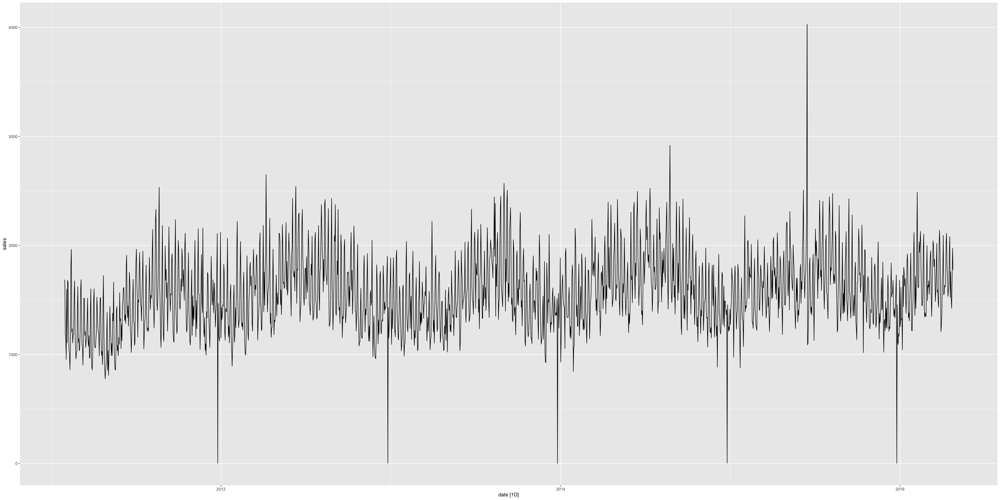

In [36]:
df_product_cluster = df_product_features_scaled_cluster %>% 
    select(id, cluster)
df_sales_cal_price_cluster = merge(df_product_cluster, df_sales_cal_price, by=c("id"))
tsibble_aggregated_sales = df_sales_cal_price_cluster %>%
    group_by(date)  %>%
    summarise(sales = sum(sales), .groups="drop")  %>%
    as_tsibble(index=date)
tsibble_aggregated_sales %>%
    autoplot(sales)

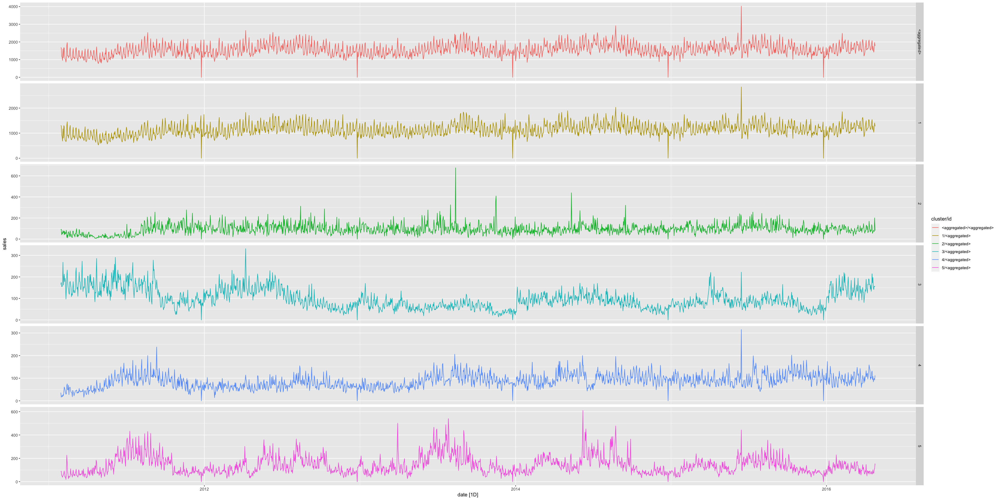

In [37]:
draw_hts_sales = function(df_sales_cal_price_cluster){
    df_sales_cal_price_cluster = df_sales_cal_price_cluster %>%
    mutate(cluster = as.factor(cluster))
    tsibble_sales_cluster <- df_sales_cal_price_cluster %>%
      as_tsibble(key = c(cluster, id), index = date) 
    hts_sales = tsibble_sales_cluster %>%
         aggregate_key(cluster/id, sales = sum(sales))
    options(repr.plot.width=30, repr.plot.height=15)
    hts_sales %>%
        filter(is_aggregated(id)) %>%
        autoplot(sales) + 
        facet_grid(vars(cluster), scales = "free_y")
}
draw_hts_sales(df_sales_cal_price_cluster)


In [38]:
df_product_features_gmm = df_product_features_scaled_cluster %>%
    select(id, cluster)
head(df_product_features_gmm)

,id,cluster
,<chr>,<dbl>
1,FOODS_3_001_TX_3_validation,1
2,FOODS_3_002_TX_3_validation,1
3,FOODS_3_003_TX_3_validation,2
4,FOODS_3_004_TX_3_validation,1
5,FOODS_3_005_TX_3_validation,1
6,FOODS_3_006_TX_3_validation,2


## dbscan

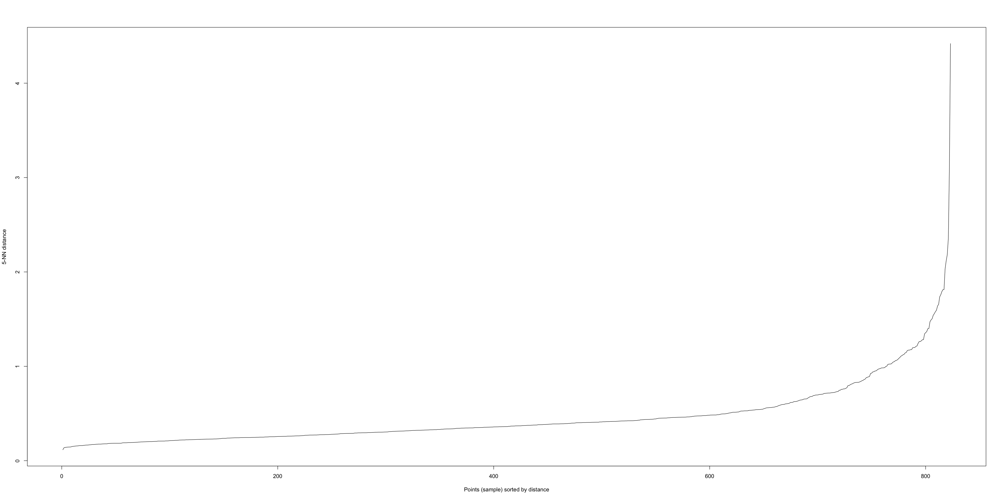

In [39]:
kNNdistplot(df_product_features_scaled[,-1], k=5)

In [40]:
db = dbscan(df_product_features_scaled[,-1],eps = 1.5, minPts=5)

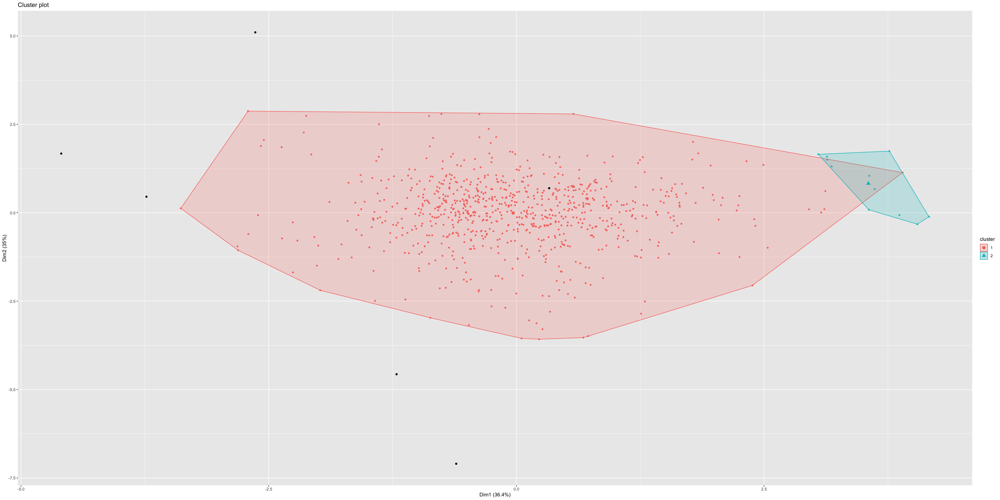

In [41]:
fviz_cluster(db, df_product_features_scaled[,-1], geom="point")

## Cluster features

### Hierarchical clustering results

In [42]:
unique(df_product_features_hc$cluster)
head(df_product_features_hc)

[1] 1 2 3 4 5 6
Levels: 1 2 3 4 5 6

,id,cluster
,<chr>,<fct>
1,FOODS_3_001_TX_3_validation,1
2,FOODS_3_002_TX_3_validation,1
3,FOODS_3_003_TX_3_validation,2
4,FOODS_3_004_TX_3_validation,3
5,FOODS_3_005_TX_3_validation,4
6,FOODS_3_006_TX_3_validation,2


In [48]:
write.csv(df_product_features_hc, "df_product_features_hc.csv", row.names = FALSE)
head(read.csv("df_product_features_hc.csv"))

,id,cluster
,<chr>,<int>
1,FOODS_3_001_TX_3_validation,1
2,FOODS_3_002_TX_3_validation,1
3,FOODS_3_003_TX_3_validation,2
4,FOODS_3_004_TX_3_validation,3
5,FOODS_3_005_TX_3_validation,4
6,FOODS_3_006_TX_3_validation,2


### GMM clustering results

In [43]:
unique(df_product_features_gmm$cluster)
head(df_product_features_gmm)

[1] 1 2 3 4 5

,id,cluster
,<chr>,<dbl>
1,FOODS_3_001_TX_3_validation,1
2,FOODS_3_002_TX_3_validation,1
3,FOODS_3_003_TX_3_validation,2
4,FOODS_3_004_TX_3_validation,1
5,FOODS_3_005_TX_3_validation,1
6,FOODS_3_006_TX_3_validation,2


In [50]:
write.csv(df_product_features_gmm, "df_product_features_gmm.csv", row.names = FALSE)
head(read.csv("df_product_features_gmm.csv"))

,id,cluster
,<chr>,<int>
1,FOODS_3_001_TX_3_validation,1
2,FOODS_3_002_TX_3_validation,1
3,FOODS_3_003_TX_3_validation,2
4,FOODS_3_004_TX_3_validation,1
5,FOODS_3_005_TX_3_validation,1
6,FOODS_3_006_TX_3_validation,2
